In [2]:
# Load environment# Load  
using Pkg
Pkg.activate("..")

"/Users/domluna/github/NeuralArithmetic/Project.toml"

In [3]:
using NeuralArithmetic
using Flux
using Flux.Data.MNIST
using Plots
using DataFrames
using Distributions

┌ Info: Recompiling stale cache file /Users/domluna/.julia/compiled/v1.0/NeuralArithmetic/B9sGZ.ji for NeuralArithmetic [77cec1ae-a0aa-11e8-15c8-b1760286d022]
└ @ Base loading.jl:1184
Expr(:block, #= Symbol("/Users/domluna/.julia/packages/Flux/VzKHW/src/tracker/array.jl"):399 =#, Expr(:function, Expr(:where, Expr(:call, :flatten, Expr(:::, :bc, Expr(:curly, :Broadcasted, :Style))), :Style), Expr(:block, #= Symbol("/Users/domluna/.julia/packages/Flux/VzKHW/src/tracker/array.jl"):400 =#, Expr(:&&, Expr(:call, :isflat, :bc), Expr(:return, :bc)), #= Symbol("/Users/domluna/.julia/packages/Flux/VzKHW/src/tracker/array.jl"):401 =#, :args = Expr(:call, :cat_nested, :bc), #= Symbol("/Users/domluna/.julia/packages/Flux/VzKHW/src/tracker/array.jl"):402 =#, Expr(:let, Expr(:block, :makeargs = Expr(:call, :make_makeargs, :bc), :f = Expr(:., :bc, :(:f))), Expr(:block, #= Symbol("/Users/domluna/.julia/packages/Flux/VzKHW/src/tracker/array.jl"):403 =#, :newf = Expr(:macrocall, Symbol("@inline"), #= Sy

┌ Info: Recompiling stale cache file /Users/domluna/.julia/compiled/v1.0/DataFrames/AR9oZ.ji for DataFrames [a93c6f00-e57d-5684-b7b6-d8193f3e46c0]
└ @ Base loading.jl:1184


loaded


┌ Info: Recompiling stale cache file /Users/domluna/.julia/compiled/v1.0/Distributions/xILW0.ji for Distributions [31c24e10-a181-5473-b8eb-7969acd0382f]
└ @ Base loading.jl:1184


Load MNIST dataset.

In [4]:
imgs = MNIST.images()
labels = Flux.onehotbatch(MNIST.labels(), 0:9)

10×60000 Flux.OneHotMatrix{Array{Flux.OneHotVector,1}}:
 false   true  false  false  false  …  false  false  false  false  false
 false  false  false   true  false     false  false  false  false  false
 false  false  false  false  false     false  false  false  false  false
 false  false  false  false  false     false   true  false  false  false
 false  false   true  false  false     false  false  false  false  false
  true  false  false  false  false  …  false  false   true  false  false
 false  false  false  false  false     false  false  false   true  false
 false  false  false  false  false     false  false  false  false  false
 false  false  false  false  false      true  false  false  false   true
 false  false  false  false   true     false  false  false  false  false

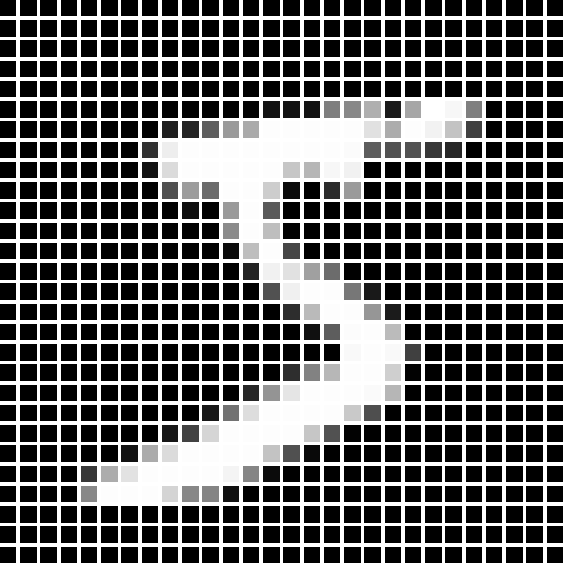

In [5]:
# fancy printing
imgs[1]

Model adapted from https://github.com/pytorch/examples/blob/master/mnist/main.py.

In [6]:
convnet = Chain(
  Conv((2,2), 1=>16, relu),
  x -> maxpool(x, (2,2)),
  Conv((2,2), 16=>8, relu),
  x -> maxpool(x, (2,2)),
  x -> reshape(x, :, size(x, 4)),
  Dense(288, 10), softmax)

Chain(Conv((2, 2), 1=>16, NNlib.relu), getfield(Main, Symbol("##3#6"))(), Conv((2, 2), 16=>8, NNlib.relu), getfield(Main, Symbol("##4#7"))(), getfield(Main, Symbol("##5#8"))(), Dense(288, 10), NNlib.softmax)

In [ ]:
float.(imgs)